## Siemens PCA and FPCA as outlier detector

This code shows the implementation FPCA for reducing the dimension of the multiple time series after removing bad error codes.
It adds the scores and identify the time series which contribute the most to the principal components. 

**Index**

1. Loading the datasets
2. Transposing the time series datasets
3. Merging time series datasets to add additional features
4. Filtering and spliting in Blood and Aquous groups
5. Window extraction
   - 5.1. Validating if there are partial or full missing values after the extraction
7. Function to plot time series in one plot
8. Visualization of Time Series from the Windows
9. Functional PCA (Visualization of Principal Component Plots in one row)
    - 8.1. Functional PCA characterization function
        - 8.1.1. Functional PC1 and Characterization of FPC Scores
     

The improvements with respect to the code "Siemens_PCA_FPCA.ipybn" are:

In 11) The functional principal componet plots are display in one row **(WE CAN ADJUST Y_AXIS LIMITS OR PLOT THE DEFAULT ONES, HOWEVER, THE RANGE CAN BE DECEIVING)**.
Additionally, we add the plots of the first principal component for both systems together and characterize the PC scores by mapping with colors the additional attributes.

## 1. Loading the datasets

In [1]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import altair as alt
import random
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from skfda.representation.grid import FDataGrid
from skfda.preprocessing.dim_reduction.projection import FPCA

/var/folders/_c/wdm33bq11dvflh73ffxrd8z40000gn/T/ipykernel_4172/212172022.py:10: DeprecationWarning: The module "projection" is deprecated. Please use "dim_reduction"
  from skfda.preprocessing.dim_reduction.projection import FPCA


## 2. Transposing the time series datasets 

In [2]:
# Import datasets
sensorA_System1 = pd.read_csv("RawData/System1_SensorA.csv")
sensorA_System2 = pd.read_csv("RawData/System2_SensorA.csv")
sensorB_System1 = pd.read_csv("RawData/System1_SensorB.csv")
sensorB_System2 = pd.read_csv("RawData/System2_SensorB.csv")
sensorA_System1_missing = pd.read_csv("RawData/SensorA_System1_missing values.csv")
sensorA_System2_missing = pd.read_csv("RawData/SensorA_System2_missing values.csv")
keyByTestID = pd.read_csv("RawData/Key by TestID.csv", parse_dates=['DateTime'])

## 3. Merging time series datasets to add additional features

In [3]:
# Transpose dataset to make columns as timestamps and rows as tests

# Sensor A
A1_transposed = sensorA_System1.T.reset_index()
A1_transposed.columns = A1_transposed.iloc[0]
A1_transposed.rename(columns={A1_transposed.columns[0]: 'TestID'}, inplace=True)
A1_transposed = A1_transposed.drop(0)
A1_transposed['TestID'] = A1_transposed['TestID'].astype(int)

A2_transposed = sensorA_System2.T.reset_index()
A2_transposed.columns = A2_transposed.iloc[0]
A2_transposed.rename(columns={A2_transposed.columns[0]: 'TestID'}, inplace=True)
A2_transposed = A2_transposed.drop(0)
A2_transposed['TestID'] = A2_transposed['TestID'].astype(int)

A1_missing_transposed = sensorA_System1_missing.T.reset_index()
A1_missing_transposed.columns = A1_missing_transposed.iloc[0]
A1_missing_transposed.rename(columns={A1_missing_transposed.columns[0]: 'TestID'}, inplace=True)
A1_missing_transposed = A1_missing_transposed.drop(0)
A1_missing_transposed['TestID'] = A1_missing_transposed['TestID'].astype(int)

A2_missing_transposed = sensorA_System2_missing.T.reset_index()
A2_missing_transposed.columns = A2_missing_transposed.iloc[0]
A2_missing_transposed.rename(columns={A2_missing_transposed.columns[0]: 'TestID'}, inplace=True)
A2_missing_transposed = A2_missing_transposed.drop(0)
A2_missing_transposed['TestID'] = A2_missing_transposed['TestID'].astype(int)

# Sensor B
B1_transposed = sensorB_System1.T.reset_index()
B1_transposed.columns = B1_transposed.iloc[0]
B1_transposed.rename(columns={B1_transposed.columns[0]: 'TestID'}, inplace=True)
B1_transposed = B1_transposed.drop(0)
B1_transposed['TestID'] = B1_transposed['TestID'].astype(int)

B2_transposed = sensorB_System2.T.reset_index()
B2_transposed.columns = B2_transposed.iloc[0]
B2_transposed.rename(columns={B2_transposed.columns[0]: 'TestID'}, inplace=True)
B2_transposed = B2_transposed.drop(0)
B2_transposed['TestID'] = B2_transposed['TestID'].astype(int)

In [4]:
# Complete A1 and A2 with the missing values
A1_transposed_mid = A1_transposed[~A1_transposed.TestID.isin(A1_missing_transposed.TestID)]
A1_transposed = pd.concat([A1_transposed_mid, A1_missing_transposed], axis=0)
A2_transposed_mid = A2_transposed[~A2_transposed.TestID.isin(A2_missing_transposed.TestID)]
A2_transposed = pd.concat([A2_transposed_mid, A2_missing_transposed], axis=0)

In [5]:
# Merge dataset with keyByTestID and delete unmatched tests
keyByTestID['TestID'] = keyByTestID['TestID'].astype(int)
keyByTestID['System'] = keyByTestID['System'].astype(str)
keyByTestID = keyByTestID[keyByTestID['ReturnCode'].isin(['Success','UnderReportableRange'])]

A1_keyByTestID = keyByTestID[(keyByTestID['Sensor'] == 'Sensor A') & (keyByTestID['System'] == 'System 1')]
A1_Merged = pd.merge(A1_keyByTestID,A1_transposed,how='inner', on=['TestID'])
A1_transposed = A1_transposed[A1_transposed['TestID'].isin(A1_Merged['TestID'])]

A2_keyByTestID = keyByTestID.loc[(keyByTestID['Sensor'] == 'Sensor A') & (keyByTestID['System'] != 'System 1')]
A2_Merged = pd.merge(A2_keyByTestID,A2_transposed,how='inner', on=['TestID'])
A2_transposed = A2_transposed[A2_transposed['TestID'].isin(A2_Merged['TestID'])]

sensorA_System1 = sensorA_System1.loc[:, sensorA_System1.columns.isin(A1_Merged['TestID'].astype(str))]
sensorA_System2 = sensorA_System2.loc[:, sensorA_System2.columns.isin(A2_Merged['TestID'].astype(str))]


B1_keyByTestID = keyByTestID[(keyByTestID['Sensor'] == 'Sensor B') & (keyByTestID['System'] == 'System 1')]
B1_Merged = pd.merge(B1_keyByTestID,B1_transposed,how='inner', on=['TestID'])
B1_transposed = B1_transposed[B1_transposed['TestID'].isin(B1_Merged['TestID'])]

B2_keyByTestID = keyByTestID.loc[(keyByTestID['Sensor'] == 'Sensor B') & (keyByTestID['System'] != 'System 1')]
B2_Merged = pd.merge(B2_keyByTestID,B2_transposed,how='inner', on=['TestID'])
B1_transposed = B2_transposed[B2_transposed['TestID'].isin(A2_Merged['TestID'])]

sensorB_System1 = sensorB_System1.loc[:, sensorB_System1.columns.isin(B1_Merged['TestID'].astype(str))]
sensorB_System2 = sensorB_System2.loc[:, sensorB_System2.columns.isin(B2_Merged['TestID'].astype(str))]

print('A1: ', A1_Merged.shape)
print('A2: ', A2_Merged.shape)
print('B1: ', B1_Merged.shape)
print('B2: ', B2_Merged.shape)

A1:  (3382, 3376)
A2:  (7743, 3367)
B1:  (3375, 3376)
B2:  (7745, 3367)


## 4. Filtering and spliting in Blood and Aquous groups

In [6]:
# Blood
A1_blood_Merged = A1_Merged[A1_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])].copy()
A2_blood_Merged = A2_Merged[A2_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])].copy()
A1_blood_Merged.reset_index(drop=True, inplace=True)
A2_blood_Merged.reset_index(drop=True, inplace=True)

# Aquous
A1_aquous_Merged = A1_Merged[~A1_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])].copy()
A2_aquous_Merged = A2_Merged[~A2_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])].copy()
A1_aquous_Merged.reset_index(drop=True, inplace=True)
A2_aquous_Merged.reset_index(drop=True, inplace=True)

# Blood
B1_blood_Merged = (B1_Merged[B1_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])]).copy()
B2_blood_Merged = (B2_Merged[B2_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])]).copy()
B1_blood_Merged.reset_index(drop=True, inplace=True)
B2_blood_Merged.reset_index(drop=True, inplace=True)

# Aquous
B1_aquous_Merged = (B1_Merged[~B1_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])]).copy()
B2_aquous_Merged = (B2_Merged[~B2_Merged['FluidType'].isin(['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5'])]).copy()
B1_aquous_Merged.reset_index(drop=True, inplace=True)
B2_aquous_Merged.reset_index(drop=True, inplace=True)

## 5. Window extraction

In [7]:
# Match window values of Sensor A for each test
calDelimit = 11
cal_window_size = 8
sampleDelimit = 15
sample_window_size = 5

# Match window values of Sensor B for each test

# Blood
calDelLimit_sensorB_blood = 20
sampleDelLimit_sensorB_blood = 24
calWindowSize_sensorB_blood = 18
sampleWindowSize_sensorB_blood = 4

# Aquous
calDelLimit_sensorB_aqueous = 20
sampleDelLimit_sensorB_aqueous = 30
calWindowSize_sensorB_aqueous = 18
sampleWindowSize_sensorB_aqueous = 4

# Define a function to calculate window start and end values
def calculate_window_values(bubble_start, sample_start, calDelimit_input, cal_window_size_input, sampleDelimit_input, sample_window_size_input):
    cal_window_start = bubble_start - calDelimit_input
    cal_window_end = cal_window_start + cal_window_size_input
    sample_window_start = sample_start + sampleDelimit_input
    sample_window_end = sample_window_start + sample_window_size_input
    return round(cal_window_start,1), round(cal_window_end,1), round(sample_window_start,1), round(sample_window_end,1)

# Sensor A
cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A1_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A1_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A1_Merged['cal_window_start']=cal_window_start
A1_Merged['cal_window_end']=cal_window_end
A1_Merged['sample_window_start']=sample_window_start
A1_Merged['sample_window_end']=sample_window_end

cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A2_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A2_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A2_Merged['cal_window_start']=cal_window_start
A2_Merged['cal_window_end']=cal_window_end
A2_Merged['sample_window_start']=sample_window_start
A2_Merged['sample_window_end']=sample_window_end


# Sensor A - Blood
cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A1_blood_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A1_blood_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A1_blood_Merged['cal_window_start']=cal_window_start
A1_blood_Merged['cal_window_end']=cal_window_end
A1_blood_Merged['sample_window_start']=sample_window_start
A1_blood_Merged['sample_window_end']=sample_window_end


cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A2_blood_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A2_blood_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A2_blood_Merged['cal_window_start']=cal_window_start
A2_blood_Merged['cal_window_end']=cal_window_end
A2_blood_Merged['sample_window_start']=sample_window_start
A2_blood_Merged['sample_window_end']=sample_window_end


# Sensor A - Aquous
cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A1_aquous_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A1_aquous_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A1_aquous_Merged['cal_window_start']=cal_window_start
A1_aquous_Merged['cal_window_end']=cal_window_end
A1_aquous_Merged['sample_window_start']=sample_window_start
A1_aquous_Merged['sample_window_end']=sample_window_end


cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A2_aquous_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A2_aquous_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A2_aquous_Merged['cal_window_start']=cal_window_start
A2_aquous_Merged['cal_window_end']=cal_window_end
A2_aquous_Merged['sample_window_start']=sample_window_start
A2_aquous_Merged['sample_window_end']=sample_window_end

# Sensor B - Blood
cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=B1_blood_Merged['BubbleDetectTime'],
                                                                                                   sample_start=B1_blood_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelLimit_sensorB_blood,
                                                                                                   cal_window_size_input=calWindowSize_sensorB_blood,
                                                                                                   sampleDelimit_input=sampleDelLimit_sensorB_blood,
                                                                                                   sample_window_size_input=sampleWindowSize_sensorB_blood)
B1_blood_Merged['cal_window_start']=cal_window_start
B1_blood_Merged['cal_window_end']=cal_window_end
B1_blood_Merged['sample_window_start']=sample_window_start
B1_blood_Merged['sample_window_end']=sample_window_end

cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=B2_blood_Merged['BubbleDetectTime'],
                                                                                                   sample_start=B2_blood_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelLimit_sensorB_blood,
                                                                                                   cal_window_size_input=calWindowSize_sensorB_blood,
                                                                                                   sampleDelimit_input=sampleDelLimit_sensorB_blood,
                                                                                                   sample_window_size_input=sampleWindowSize_sensorB_blood)
B2_blood_Merged['cal_window_start']=cal_window_start
B2_blood_Merged['cal_window_end']=cal_window_end
B2_blood_Merged['sample_window_start']=sample_window_start
B2_blood_Merged['sample_window_end']=sample_window_end


# Sensor B - Aquous
cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=B1_aquous_Merged['BubbleDetectTime'],
                                                                                                   sample_start=B1_aquous_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelLimit_sensorB_aqueous,
                                                                                                   cal_window_size_input=calWindowSize_sensorB_aqueous,
                                                                                                   sampleDelimit_input=sampleDelLimit_sensorB_aqueous,
                                                                                                   sample_window_size_input=sampleWindowSize_sensorB_aqueous)
B1_aquous_Merged['cal_window_start']=cal_window_start
B1_aquous_Merged['cal_window_end']=cal_window_end
B1_aquous_Merged['sample_window_start']=sample_window_start
B1_aquous_Merged['sample_window_end']=sample_window_end


cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=B2_aquous_Merged['BubbleDetectTime'],
                                                                                                   sample_start=B2_aquous_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelLimit_sensorB_aqueous,
                                                                                                   cal_window_size_input=calWindowSize_sensorB_aqueous,
                                                                                                   sampleDelimit_input=sampleDelLimit_sensorB_aqueous,
                                                                                                   sample_window_size_input=sampleWindowSize_sensorB_aqueous)
B2_aquous_Merged['cal_window_start']=cal_window_start
B2_aquous_Merged['cal_window_end']=cal_window_end
B2_aquous_Merged['sample_window_start']=sample_window_start
B2_aquous_Merged['sample_window_end']=sample_window_end

In [8]:
# Define a function to extract window data of each test
def calculate_window_data(row):
    cal_start_time = row['cal_window_start']
    cal_end_time = row['cal_window_end']
    sample_start_time = row['sample_window_start']
    sample_end_time = row['sample_window_end']
    timestamps = row.index[18:-4].values.astype(float)
    cal_window = timestamps[(timestamps >= cal_start_time) & (timestamps <= cal_end_time)]
    sample_window = timestamps[(timestamps >= sample_start_time) & (timestamps <= sample_end_time)]
    return row[cal_window],row[sample_window]

# Sensor A

A1_cal_window = []
A1_sample_window = []
for i in range(len(A1_Merged)):
    cal_window, sample_window = calculate_window_data(A1_Merged.iloc[i, :])
    A1_cal_window.append(cal_window.values)
    A1_sample_window.append(sample_window.values)
A1_cal_window = pd.DataFrame(A1_cal_window)
A1_sample_window = pd.DataFrame(A1_sample_window)
A1_cal_window['TestID'] = A1_sample_window['TestID'] = A1_Merged['TestID']
A1_sample_window.set_index('TestID',inplace=True)
A1_cal_window.set_index('TestID',inplace=True)

A2_cal_window = []
A2_sample_window = []
for i in range(len(A2_Merged)):
    cal_window, sample_window = calculate_window_data(A2_Merged.iloc[i, :])
    A2_cal_window.append(cal_window.values)
    A2_sample_window.append(sample_window.values)
A2_cal_window = pd.DataFrame(A2_cal_window)
A2_sample_window = pd.DataFrame(A2_sample_window)
A2_cal_window['TestID'] = A2_sample_window['TestID'] = A2_Merged['TestID']
A2_sample_window.set_index('TestID',inplace=True)
A2_cal_window.set_index('TestID',inplace=True)

# System 1 - Sensor A - Blood

A1_blood_cal_window = []
A1_blood_sample_window = []
for i in range(len(A1_blood_Merged)):
    cal_window, sample_window = calculate_window_data(A1_blood_Merged.iloc[i, :])
    A1_blood_cal_window.append(cal_window.values)
    A1_blood_sample_window.append(sample_window.values)
A1_blood_cal_window = pd.DataFrame(A1_blood_cal_window)
A1_blood_sample_window = pd.DataFrame(A1_blood_sample_window)
A1_blood_cal_window['TestID'] = A1_blood_sample_window['TestID'] = A1_blood_Merged['TestID']
A1_blood_sample_window.set_index('TestID',inplace=True)
A1_blood_cal_window.set_index('TestID',inplace=True)

# System 1 - Sensor A - Aquous

A1_aquous_cal_window = []
A1_aquous_sample_window = []
for i in range(len(A1_aquous_Merged)):
    cal_window, sample_window = calculate_window_data(A1_aquous_Merged.iloc[i, :])
    A1_aquous_cal_window.append(cal_window.values)
    A1_aquous_sample_window.append(sample_window.values)
A1_aquous_cal_window = pd.DataFrame(A1_aquous_cal_window)
A1_aquous_sample_window = pd.DataFrame(A1_aquous_sample_window)
A1_aquous_cal_window['TestID'] = A1_aquous_sample_window['TestID'] = A1_aquous_Merged['TestID']
A1_aquous_sample_window.set_index('TestID',inplace=True)
A1_aquous_cal_window.set_index('TestID',inplace=True)

# System 2 - Sensor A - Blood

A2_blood_cal_window = []
A2_blood_sample_window = []
for i in range(len(A2_blood_Merged)):
    cal_window, sample_window = calculate_window_data(A2_blood_Merged.iloc[i, :])
    A2_blood_cal_window.append(cal_window.values)
    A2_blood_sample_window.append(sample_window.values)
A2_blood_cal_window = pd.DataFrame(A2_blood_cal_window)
A2_blood_sample_window = pd.DataFrame(A2_blood_sample_window)
A2_blood_cal_window['TestID'] = A2_blood_sample_window['TestID'] = A2_blood_Merged['TestID']
A2_blood_sample_window.set_index('TestID',inplace=True)
A2_blood_cal_window.set_index('TestID',inplace=True)

# System 2 - Sensor A - Aquous

A2_aquous_cal_window = []
A2_aquous_sample_window = []
for i in range(len(A2_aquous_Merged)):
    cal_window, sample_window = calculate_window_data(A2_aquous_Merged.iloc[i, :])
    A2_aquous_cal_window.append(cal_window.values)
    A2_aquous_sample_window.append(sample_window.values)
A2_aquous_cal_window = pd.DataFrame(A2_aquous_cal_window)
A2_aquous_sample_window = pd.DataFrame(A2_aquous_sample_window)
A2_aquous_cal_window['TestID'] = A2_aquous_sample_window['TestID'] = A2_aquous_Merged['TestID']
A2_aquous_sample_window.set_index('TestID',inplace=True)
A2_aquous_cal_window.set_index('TestID',inplace=True)

# System 1 - Sensor B - Blood

B1_blood_cal_window = []
B1_blood_sample_window = []
for i in range(len(B1_blood_Merged)):
    cal_window, sample_window = calculate_window_data(B1_blood_Merged.iloc[i, :])
    B1_blood_cal_window.append(cal_window.values)
    B1_blood_sample_window.append(sample_window.values)
B1_blood_cal_window = pd.DataFrame(B1_blood_cal_window)
B1_blood_sample_window = pd.DataFrame(B1_blood_sample_window)
B1_blood_cal_window['TestID'] = B1_blood_sample_window['TestID'] = B1_blood_Merged['TestID']
B1_blood_sample_window.set_index('TestID',inplace=True)
B1_blood_cal_window.set_index('TestID',inplace=True)

# System 2 - Sensor B - Blood

B2_blood_cal_window = []
B2_blood_sample_window = []
for i in range(len(B2_blood_Merged)):
    cal_window, sample_window = calculate_window_data(B2_blood_Merged.iloc[i, :])
    B2_blood_cal_window.append(cal_window.values)
    B2_blood_sample_window.append(sample_window.values)
B2_blood_cal_window = pd.DataFrame(B2_blood_cal_window)
B2_blood_sample_window = pd.DataFrame(B2_blood_sample_window)
B2_blood_cal_window['TestID'] = B2_blood_sample_window['TestID'] = B2_blood_Merged['TestID']
B2_blood_sample_window.set_index('TestID',inplace=True)
B2_blood_cal_window.set_index('TestID',inplace=True)

# System 1 - Sensor B - Aquous

B1_aquous_cal_window = []
B1_aquous_sample_window = []
for i in range(len(B1_aquous_Merged)):
    cal_window, sample_window = calculate_window_data(B1_aquous_Merged.iloc[i, :])
    B1_aquous_cal_window.append(cal_window.values)
    B1_aquous_sample_window.append(sample_window.values)
B1_aquous_cal_window = pd.DataFrame(B1_aquous_cal_window)
B1_aquous_sample_window = pd.DataFrame(B1_aquous_sample_window)
B1_aquous_cal_window['TestID'] = B1_aquous_sample_window['TestID'] = B1_aquous_Merged['TestID']
B1_aquous_sample_window.set_index('TestID',inplace=True)
B1_aquous_cal_window.set_index('TestID',inplace=True)

# System 1 - Sensor B - Aquous

B2_aquous_cal_window = []
B2_aquous_sample_window = []
for i in range(len(B2_aquous_Merged)):
    cal_window, sample_window = calculate_window_data(B2_aquous_Merged.iloc[i, :])
    B2_aquous_cal_window.append(cal_window.values)
    B2_aquous_sample_window.append(sample_window.values)
B2_aquous_cal_window = pd.DataFrame(B2_aquous_cal_window)
B2_aquous_sample_window = pd.DataFrame(B2_aquous_sample_window)
B2_aquous_cal_window['TestID'] = B2_aquous_sample_window['TestID'] = B2_aquous_Merged['TestID']
B2_aquous_sample_window.set_index('TestID',inplace=True)
B2_aquous_cal_window.set_index('TestID',inplace=True)

## 5.1. Validating if there are partial or full missing values after the extraction

In [9]:
A1_cal_window_drop_index = A1_cal_window.loc[A1_cal_window.isna().sum(axis=1)!=0].index
A2_cal_window_drop_index = A2_cal_window.loc[A2_cal_window.isna().sum(axis=1)!=0].index

A1_blood_cal_window_drop_index = A1_blood_cal_window.loc[A1_blood_cal_window.isna().sum(axis=1)!=0].index
A1_aquous_cal_window_drop_index = A1_aquous_cal_window.loc[A1_aquous_cal_window.isna().sum(axis=1)!=0].index
A2_blood_cal_window_drop_index = A2_blood_cal_window.loc[A2_blood_cal_window.isna().sum(axis=1)!=0].index
A2_aquous_cal_window_drop_index = A2_aquous_cal_window.loc[A2_aquous_cal_window.isna().sum(axis=1)!=0].index

B1_blood_cal_window_drop_index = B1_blood_cal_window.loc[B1_blood_cal_window.isna().sum(axis=1)!=0].index
B1_aquous_cal_window_drop_index = B1_aquous_cal_window.loc[B1_aquous_cal_window.isna().sum(axis=1)!=0].index
B2_blood_cal_window_drop_index = B2_blood_cal_window.loc[B2_blood_cal_window.isna().sum(axis=1)!=0].index
B2_aquous_cal_window_drop_index = B2_aquous_cal_window.loc[B2_aquous_cal_window.isna().sum(axis=1)!=0].index

A1_sample_window_drop_index = A1_sample_window.loc[A1_sample_window.isna().sum(axis=1)!=0].index
A2_sample_window_drop_index = A2_sample_window.loc[A2_sample_window.isna().sum(axis=1)!=0].index

A1_blood_sample_window_drop_index = A1_blood_sample_window.loc[A1_blood_sample_window.isna().sum(axis=1)!=0].index
A1_aquous_sample_window_drop_index = A1_aquous_sample_window.loc[A1_aquous_sample_window.isna().sum(axis=1)!=0].index
A2_blood_sample_window_drop_index = A2_blood_sample_window.loc[A2_blood_sample_window.isna().sum(axis=1)!=0].index
A2_aquous_sample_window_drop_index = A2_aquous_sample_window.loc[A2_aquous_sample_window.isna().sum(axis=1)!=0].index

B1_blood_sample_window_drop_index = B1_blood_sample_window.loc[B1_blood_sample_window.isna().sum(axis=1)!=0].index
B1_aquous_sample_window_drop_index = B1_aquous_sample_window.loc[B1_aquous_sample_window.isna().sum(axis=1)!=0].index
B2_blood_sample_window_drop_index = B2_blood_sample_window.loc[B2_blood_sample_window.isna().sum(axis=1)!=0].index
B2_aquous_sample_window_drop_index = B2_aquous_sample_window.loc[B2_aquous_sample_window.isna().sum(axis=1)!=0].index

# Check if missing values in different windows is different
print("The missing value in calibration window:",A1_cal_window_drop_index)
print("The missing value in sample window:",A1_sample_window_drop_index)
print("The missing value in calibration window:",A2_cal_window_drop_index)
print("The missing value in sample window:",A2_sample_window_drop_index)

print("The missing value in calibration window:",B1_blood_cal_window_drop_index)
print("The missing value in sample window:",B1_blood_sample_window_drop_index)
print("The missing value in calibration window:",B2_blood_cal_window_drop_index)
print("The missing value in sample window:",B2_blood_sample_window_drop_index)

print('Shape of the time series after extraction')
print('A1_cal: ', A1_cal_window.shape)
print('A2_cal: ',  A2_cal_window.shape)

print('A1_blood_cal_window: ', A1_blood_cal_window.shape)
print('A1_aquous_cal_window: ', A1_aquous_cal_window.shape)
print('A2_blood_cal_window: ', A2_blood_cal_window.shape)
print('A2_aquous_cal_window: ', A2_aquous_cal_window.shape)

print('B1_blood_cal_window: ', B1_blood_cal_window.shape)
print('B1_aquous_cal_window: ', B1_aquous_cal_window.shape)
print('B2_blood_cal_window: ', B2_blood_cal_window.shape)
print('B2_aquous_cal_window: ', B2_aquous_cal_window.shape)


print('A1_sample: ', A1_sample_window.shape)
print('A2_sample: ', A2_sample_window.shape)

print('A1_blood_sample_window: ', A1_blood_sample_window.shape)
print('A1_aquous_sample_window: ', A1_aquous_sample_window.shape)
print('A2_blood_sample_window: ', A2_blood_sample_window.shape)
print('A2_aquous_sample_window: ', A2_aquous_sample_window.shape)

print('B1_blood_sample_window: ', B1_blood_sample_window.shape)
print('B1_aquous_sample_window: ', B1_aquous_sample_window.shape)
print('B2_blood_sample_window: ', B2_blood_sample_window.shape)
print('B2_aquous_sample_window: ', B2_aquous_sample_window.shape)

The missing value in calibration window: Int64Index([], dtype='int64', name='TestID')
The missing value in sample window: Int64Index([], dtype='int64', name='TestID')
The missing value in calibration window: Int64Index([], dtype='int64', name='TestID')
The missing value in sample window: Int64Index([], dtype='int64', name='TestID')
The missing value in calibration window: Int64Index([], dtype='int64', name='TestID')
The missing value in sample window: Int64Index([], dtype='int64', name='TestID')
The missing value in calibration window: Int64Index([], dtype='int64', name='TestID')
The missing value in sample window: Int64Index([], dtype='int64', name='TestID')
Shape of the time series after extraction
A1_cal:  (3382, 41)
A2_cal:  (7743, 41)
A1_blood_cal_window:  (1949, 41)
A1_aquous_cal_window:  (1433, 41)
A2_blood_cal_window:  (4892, 41)
A2_aquous_cal_window:  (2851, 41)
B1_blood_cal_window:  (1944, 91)
B1_aquous_cal_window:  (1431, 91)
B2_blood_cal_window:  (4893, 91)
B2_aquous_cal_wi

## 6. Function to plot time series in one plot

In [10]:
def plot_all_time_series(df, title):
    plt.figure(figsize=(6, 4))
    
    for index, row in df.iterrows():
        plt.plot(row.values, label=f'Time Series {index + 1}')

    plt.ylabel('Electrical signals (mV)')
    plt.xlabel('Time (s)')
    plt.title(title)

## 7. Visualization of Time Series from the Windows
### System 1 and System 2: Sensor A - Blood - Cal and Sample Windows

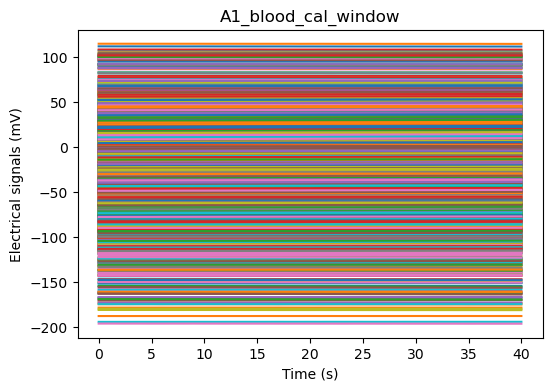

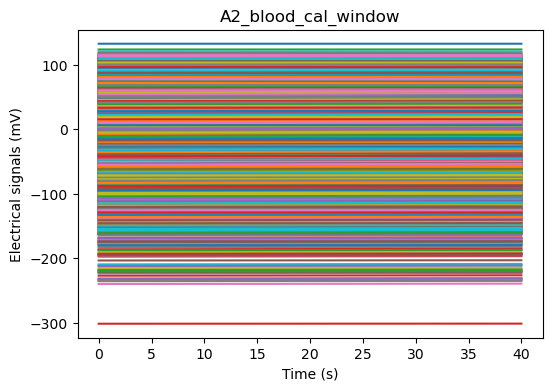

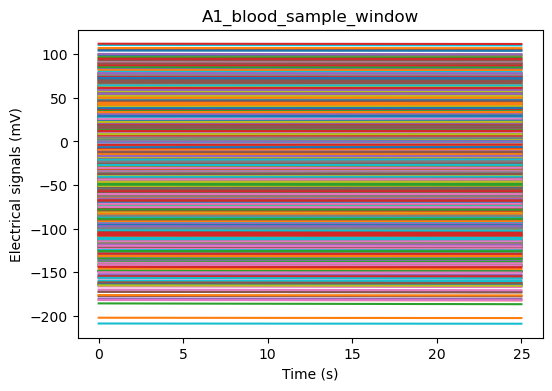

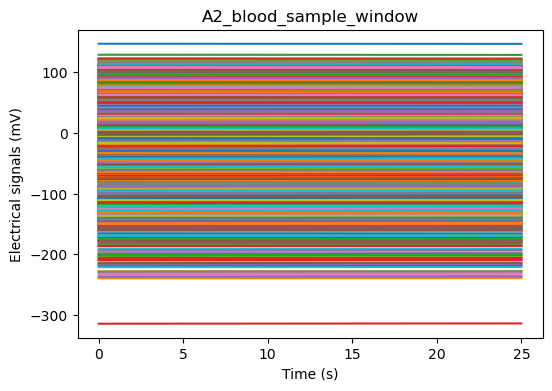

In [11]:
# Plot all the time series from the window extraction
plot_all_time_series(A1_blood_cal_window, "A1_blood_cal_window")
plot_all_time_series(A2_blood_cal_window, "A2_blood_cal_window")
plot_all_time_series(A1_blood_sample_window, "A1_blood_sample_window")
plot_all_time_series(A2_blood_sample_window, "A2_blood_sample_window")

### System 1 and System 2: Sensor A - Aqueous - Cal and Sample Windows

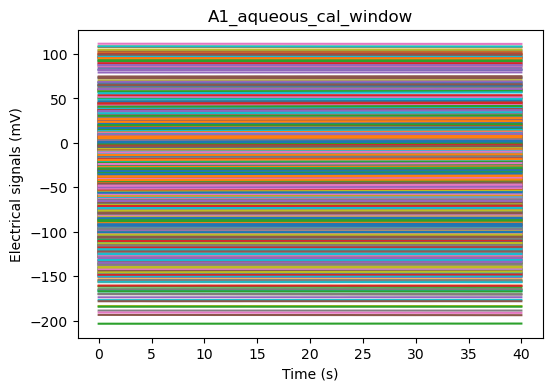

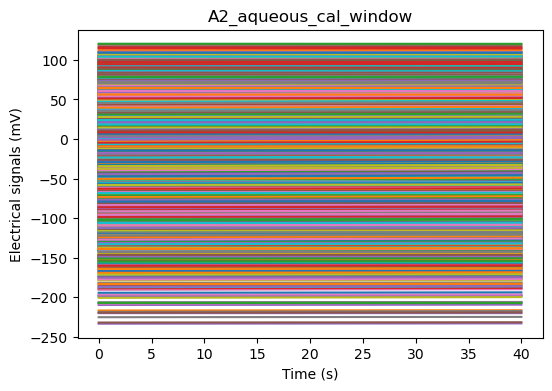

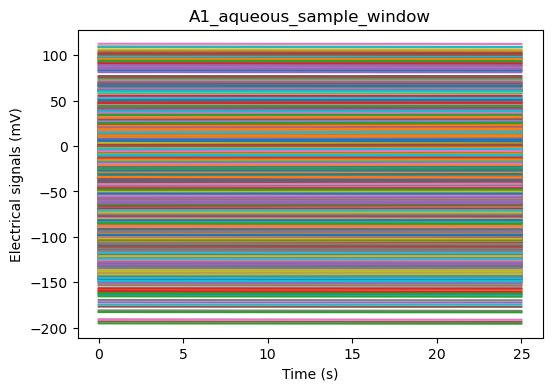

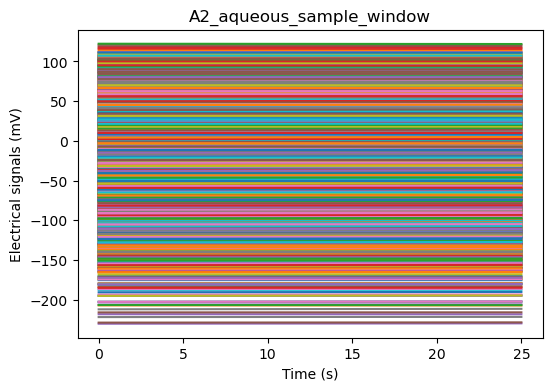

In [12]:
# Plot all the time series from the window extraction
plot_all_time_series(A1_aquous_cal_window, "A1_aqueous_cal_window")
plot_all_time_series(A2_aquous_cal_window, "A2_aqueous_cal_window")
plot_all_time_series(A1_aquous_sample_window, "A1_aqueous_sample_window")
plot_all_time_series(A2_aquous_sample_window, "A2_aqueous_sample_window")

### System 1 and System 2: Sensor B - Blood - Cal and Sample Windows

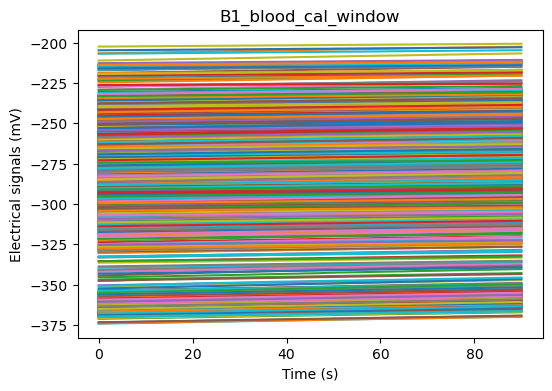

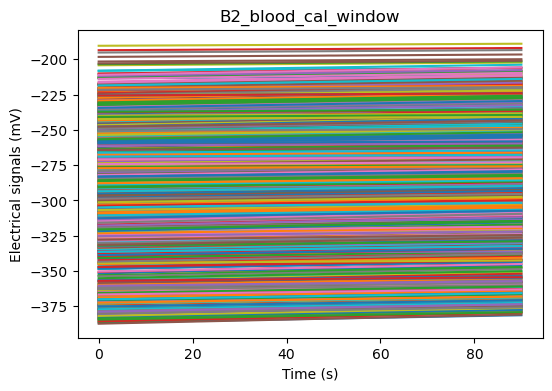

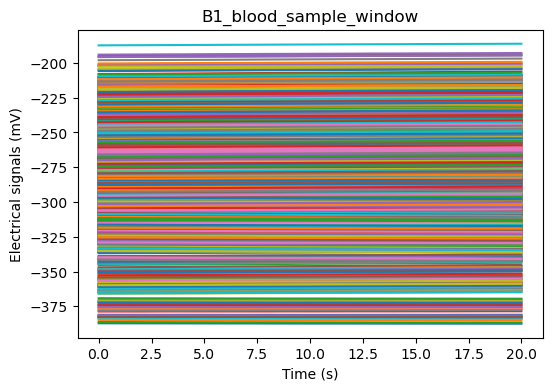

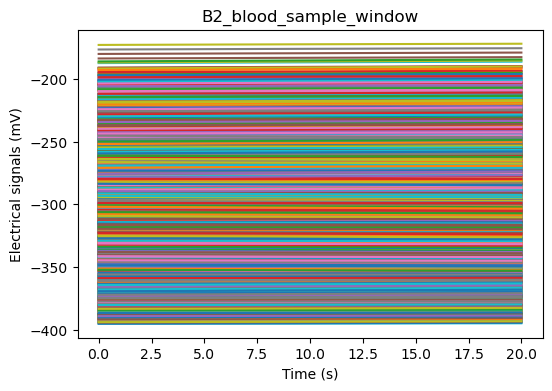

In [13]:
# Plot all the time series from the window extraction
plot_all_time_series(B1_blood_cal_window, "B1_blood_cal_window")
plot_all_time_series(B2_blood_cal_window, "B2_blood_cal_window")
plot_all_time_series(B1_blood_sample_window, "B1_blood_sample_window")
plot_all_time_series(B2_blood_sample_window, "B2_blood_sample_window")

### System 1 and System 2: Sensor B - Aqueous - Cal and Sample Windows

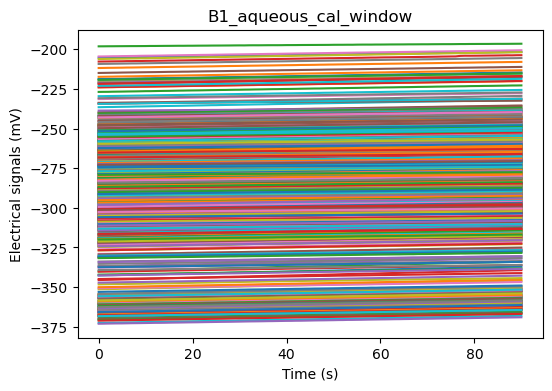

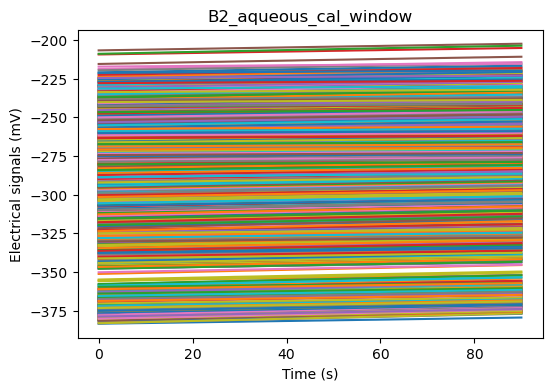

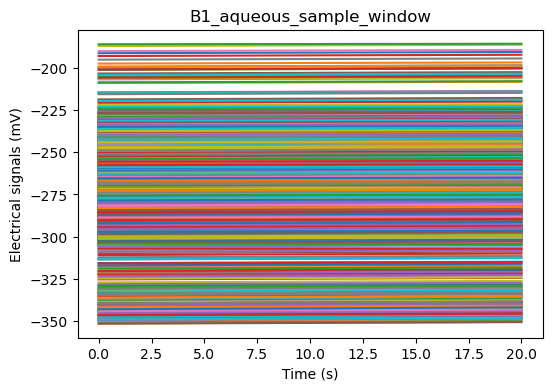

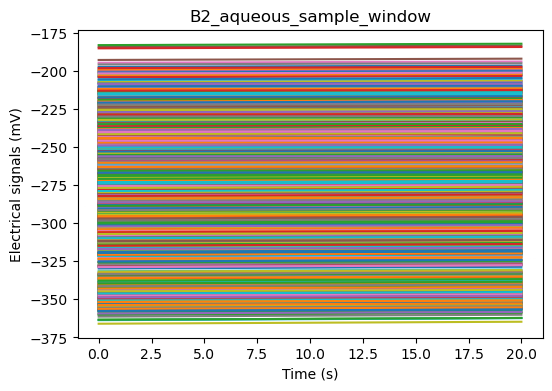

In [14]:
# Plot all the time series from the window extraction
plot_all_time_series(B1_aquous_cal_window, "B1_aqueous_cal_window")
plot_all_time_series(B2_aquous_cal_window, "B2_aqueous_cal_window")
plot_all_time_series(B1_aquous_sample_window, "B1_aqueous_sample_window")
plot_all_time_series(B2_aquous_sample_window, "B2_aqueous_sample_window")

## 8. Functional Principal Components

In [15]:
def perform_functional_pca(data_matrix, y_axis_min=None, y_axis_max=None):
    # Convert the data matrix to an FDataGrid object
    fd = FDataGrid(data_matrix=data_matrix, grid_points=data_matrix.columns.astype(float))

    # Apply Functional PCA
    fpca = FPCA(n_components=2, centering=True)
    fpca.fit(fd)
    pc_scores = fpca.transform(fd)

    # Explain variance ratio
    print('Explain variance FPC1 (%): ', fpca.explained_variance_ratio_[0] * 100)
    print('Explain variance FPC2 (%): ', fpca.explained_variance_ratio_[1] * 100)

    # --- Loadings ---
    # Extract the principal components (loadings)
    principal_components = fpca.components_
    
    # Extract loadings for each time point from the first and second principal components
    loadings_pc1 = principal_components.data_matrix[0, :, 0]  # Loadings for the first PC
    loadings_pc2 = principal_components.data_matrix[1, :, 0]  # Loadings for the second PC
    loadings_df = pd.DataFrame({
    'PC1_Loadings': loadings_pc1,
    'PC2_Loadings': loadings_pc2}, index=[f'TimePoint_{i}' for i in range(data_matrix.shape[1])])
    #print("\nLoadings:\n", loadings_df)

    # --- Scores ---
    # Print the scores to see contributions of each time series to each principal component
    pc_scores_df = pd.DataFrame(pc_scores, columns=['PC1_Scores', 'PC2_Scores'],
                                index=[data_matrix.index[i] for i in range(data_matrix.shape[0])])
    print("FPC Scores:\n", pc_scores_df)

    # Identify which time series (functional data object) contributes the most to each principal component
    max_contribution_index_pc1 = np.argmax(np.abs(pc_scores[:, 0]))  # Index of the maximum absolute score in the first PC
    max_contribution_index_pc2 = np.argmax(np.abs(pc_scores[:, 1]))  # Index of the maximum absolute score in the second PC

    print(f'The time series contributing most to PC1 is at index {max_contribution_index_pc1} with TestID {data_matrix.index[max_contribution_index_pc1]}')
    print(f'The time series contributing most to PC2 is at index {max_contribution_index_pc2} with TestID {data_matrix.index[max_contribution_index_pc2]}')
    
    # --- Plotting Principal Components ---
    fig, axs = plt.subplots(1, 3, figsize=(12, 3))

    # Both Functional PC's
    axs[0].plot(fpca.components_[0].grid_points[0], fpca.components_[0].data_matrix[0].flatten(), marker='o', linestyle='-', label='Component 1')
    axs[0].plot(fpca.components_[1].grid_points[0], fpca.components_[1].data_matrix[0].flatten(), marker='o', linestyle='-', label='Component 2')
    axs[0].set_title("Functional Principal Components")
    axs[0].set_xlabel('Time')
    axs[0].set_ylabel('Functional PC Values')
    axs[0].legend()
    axs[0].grid(True)
    axs[0].set_ylim(y_axis_min, y_axis_max)

    # FPC1
    axs[1].plot(fpca.components_[0].grid_points[0], fpca.components_[0].data_matrix[0].flatten(), marker='o', linestyle='-', label='Component 1')
    axs[1].set_title("Functional Component 1")
    axs[1].set_xlabel('Time')
    axs[1].set_ylabel('')
    axs[1].legend()
    axs[1].grid(True)
    axs[1].set_ylim(y_axis_min, y_axis_max)

    # FPC2
    axs[2].plot(fpca.components_[1].grid_points[0], fpca.components_[1].data_matrix[0].flatten(), marker='o', linestyle='-', label='Component 2', color='darkorange')
    axs[2].set_title("Functional Component 2")
    axs[2].set_xlabel('Time')
    axs[2].set_ylabel('')
    axs[2].legend()
    axs[2].grid(True)
    axs[2].set_ylim(y_axis_min, y_axis_max)

    # Adjust layout
    plt.tight_layout()

    # Show the plot
    plt.show()

# ----------------------------------------- Sensor A -----------------------------------------------

# Cal Window

## Cal Window: System 1/2 - Blood

Explain variance FPC1 (%):  99.99897848822089
Explain variance FPC2 (%):  0.0010178976351314733
FPC Scores:
           PC1_Scores  PC2_Scores
12414200 -462.087918    0.763512
12414201 -382.037994    0.147045
12414202 -478.114282    0.644482
12414203 -463.134005    0.583172
12414204 -519.278366    0.730928
...              ...         ...
12624891  -73.066419   -0.388430
12624893 -106.371122   -0.357111
12537663 -158.307970   -1.640461
12572832  530.084041    1.049927
12572836  -54.676812   -0.281475

[1949 rows x 2 columns]
The time series contributing most to PC1 is at index 1836 with TestID 12572826
The time series contributing most to PC2 is at index 1915 with TestID 12599845


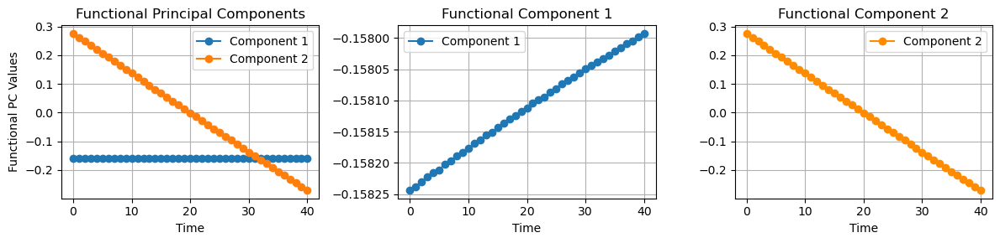

Explain variance FPC1 (%):  99.9989197116501
Explain variance FPC2 (%):  0.0010787672065730102
FPC Scores:
          PC1_Scores  PC2_Scores
3550995 -206.053189   -1.077145
3551012 -130.318139   -1.183188
3551031 -288.689649   -1.609394
3551047 -211.483163   -1.053547
3551065 -196.241950   -1.217631
...             ...         ...
3518442 -464.011127   -0.007725
3518443 -161.605834    0.014085
3518444 -172.479863    0.241987
3518445   62.302993    0.366918
3518456 -543.887857   -0.224722

[4892 rows x 2 columns]
The time series contributing most to PC1 is at index 3763 with TestID 3556087
The time series contributing most to PC2 is at index 3212 with TestID 3561214


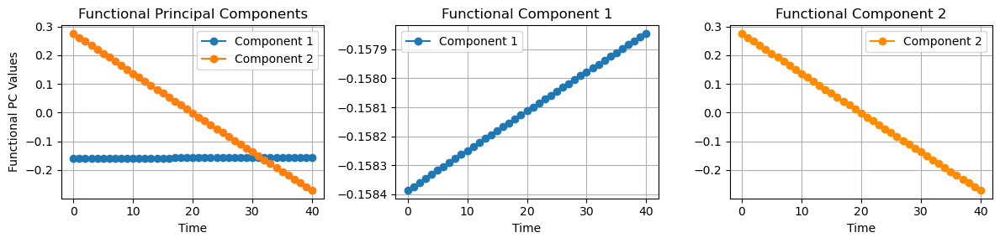

In [16]:
perform_functional_pca(A1_blood_cal_window)
perform_functional_pca(A2_blood_cal_window)
#perform_functional_pca(A1_blood_cal_window, y_axis_min=-0.6, y_axis_max=0.6)
#perform_functional_pca(A2_blood_cal_window, y_axis_min=-0.6, y_axis_max=0.6)

## Cal Window: System 1/2 - Aquous

Explain variance FPC1 (%):  99.99903631073364
Explain variance FPC2 (%):  0.000960029756191057
FPC Scores:
           PC1_Scores  PC2_Scores
12414372 -629.834138    1.125510
12414373 -595.400743    1.159224
12414374 -621.052115    1.234430
12414375 -596.268795    1.117465
12414377 -647.688876    1.506192
...              ...         ...
12470355  438.399068    1.051695
12470361  543.245842    0.948795
12470365  -16.820129   -0.712827
12539049  -95.990977   -0.456802
12622570  842.798898    1.376544

[1433 rows x 2 columns]
The time series contributing most to PC1 is at index 1042 with TestID 12573667
The time series contributing most to PC2 is at index 828 with TestID 12598120


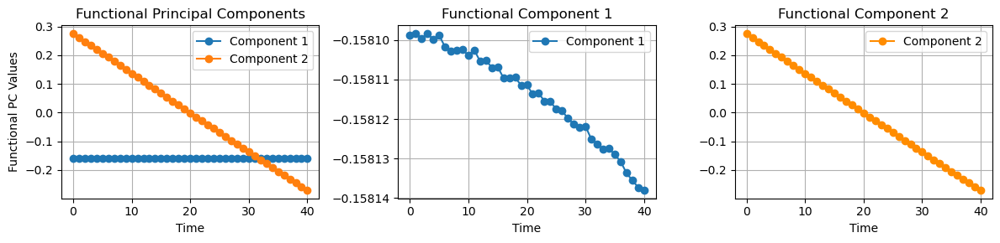

Explain variance FPC1 (%):  99.99906857395058
Explain variance FPC2 (%):  0.0009301235568349251
FPC Scores:
          PC1_Scores  PC2_Scores
3545083 -662.093661   -0.602325
3545084 -615.121571   -0.657180
3545085 -504.392395   -0.939915
3545086 -575.088528   -0.584950
3545087 -533.968128   -0.606537
...             ...         ...
3518583 -485.081960   -0.837439
3518675 -546.443438   -0.497373
3518676 -278.596442   -0.164655
3518677 -218.308876   -0.283972
3518678   -9.373598   -0.426781

[2851 rows x 2 columns]
The time series contributing most to PC1 is at index 2134 with TestID 3572300
The time series contributing most to PC2 is at index 2425 with TestID 3567819


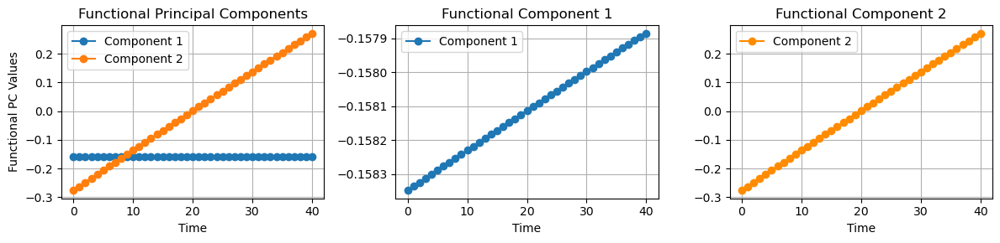

In [17]:
perform_functional_pca(A1_aquous_cal_window)
perform_functional_pca(A2_aquous_cal_window)

# Sample Window

## Sample Window: System 1/2 - Blood

Explain variance FPC1 (%):  99.99973976993837
Explain variance FPC2 (%):  0.00025638121001207893
FPC Scores:
           PC1_Scores  PC2_Scores
12414200 -331.793213    0.200776
12414201 -273.086557   -0.085186
12414202 -345.673634    0.186102
12414203 -333.986049    0.150885
12414204 -377.504851    0.178938
...              ...         ...
12624891    1.522530   -0.142170
12624893  -20.629385   -0.178693
12537663 -211.788851   -0.471412
12572832  343.858423    0.222142
12572836 -123.379271    0.100331

[1949 rows x 2 columns]
The time series contributing most to PC1 is at index 1739 with TestID 12574513
The time series contributing most to PC2 is at index 462 with TestID 12191350


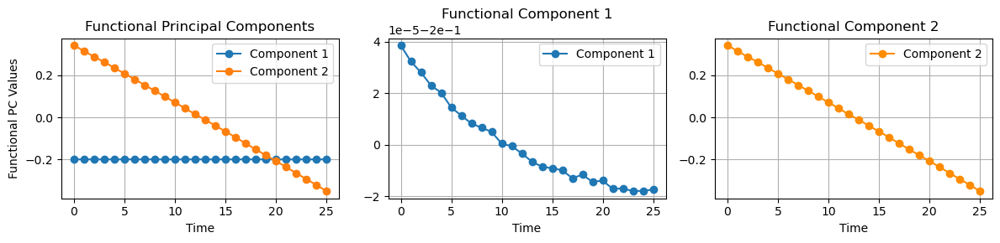

Explain variance FPC1 (%):  99.99965614804258
Explain variance FPC2 (%):  0.0003419397002924181
FPC Scores:
          PC1_Scores  PC2_Scores
3550995 -207.851308   -0.420527
3551012 -149.246733   -0.452776
3551031 -277.594030   -0.693856
3551047 -212.221089   -0.440526
3551065 -201.652602   -0.507344
...             ...         ...
3518442 -302.378709    0.178153
3518443  -64.199228    0.346386
3518444  -69.378455    0.474823
3518445  114.550773    0.657388
3518456 -366.250703    0.059213

[4892 rows x 2 columns]
The time series contributing most to PC1 is at index 3763 with TestID 3556087
The time series contributing most to PC2 is at index 3212 with TestID 3561214


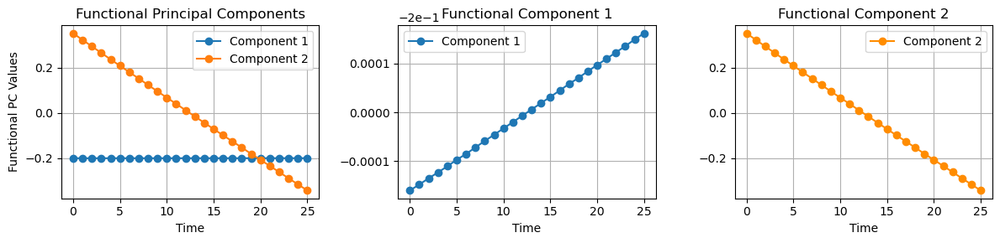

In [18]:
perform_functional_pca(A1_blood_sample_window)
perform_functional_pca(A2_blood_sample_window)

## Sample Window: System 1/2 - Aqueous

Explain variance FPC1 (%):  99.99968073771691
Explain variance FPC2 (%):  0.0003159921089964759
FPC Scores:
           PC1_Scores  PC2_Scores
12414372 -489.991060   -0.487655
12414373 -462.556423   -0.512182
12414374 -482.558618   -0.494353
12414375 -463.166186   -0.505013
12414377 -501.402449   -0.648148
...              ...         ...
12470355  354.788097   -0.472507
12470361  436.176632   -0.382653
12470365  -20.093376    0.305902
12539049  -80.128410    0.205203
12622570  673.848396   -0.589146

[1433 rows x 2 columns]
The time series contributing most to PC1 is at index 1042 with TestID 12573667
The time series contributing most to PC2 is at index 191 with TestID 12615995


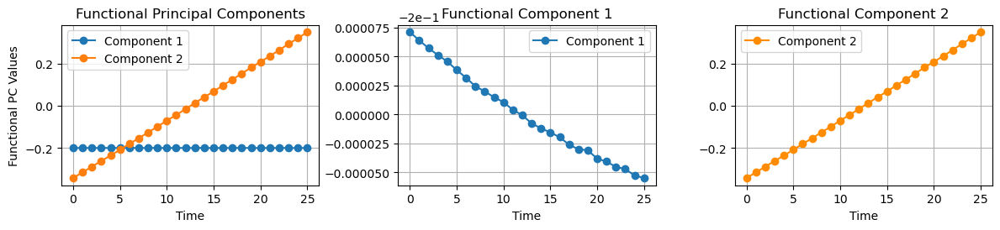

Explain variance FPC1 (%):  99.99967378883693
Explain variance FPC2 (%):  0.0003254421124388399
FPC Scores:
          PC1_Scores  PC2_Scores
3545083 -512.212132    0.385979
3545084 -475.258103    0.367990
3545085 -386.138345    0.526379
3545086 -443.990923    0.361591
3545087 -411.462628    0.411256
...             ...         ...
3518583 -371.872177    0.297401
3518675 -423.336847    0.042892
3518676 -217.550510   -0.004423
3518677 -167.827267    0.023680
3518678   -2.695489    0.070072

[2851 rows x 2 columns]
The time series contributing most to PC1 is at index 2134 with TestID 3572300
The time series contributing most to PC2 is at index 1064 with TestID 3569143


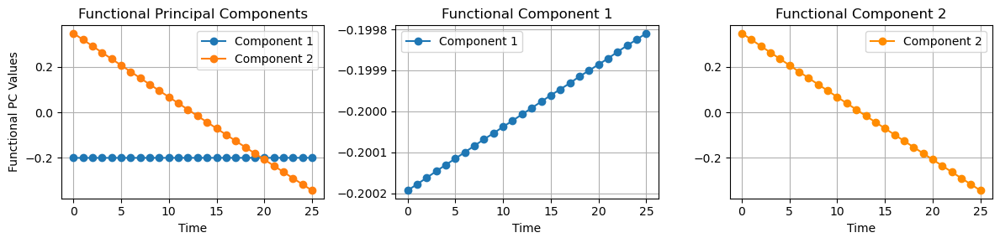

In [19]:
perform_functional_pca(A1_aquous_sample_window)
perform_functional_pca(A2_aquous_sample_window)

# ------------------------------------- Sensor B ------------------------------------------------

## Cal Window:  System 1/2 - Blood

Explain variance FPC1 (%):  99.99429965213402
Explain variance FPC2 (%):  0.005674922119799818
FPC Scores:
           PC1_Scores  PC2_Scores
12414200 -280.735614    3.616149
12414201 -273.224911    3.950660
12414202 -290.152444    3.608065
12414203 -307.783676    3.319943
12414204 -354.889295    3.775659
...              ...         ...
12537664 -246.348852    2.054196
12537668 -172.027863    0.162744
12624891  119.129034   -2.287491
12624893   39.841893   -2.576547
12537663 -137.189694    0.334835

[1944 rows x 2 columns]
The time series contributing most to PC1 is at index 219 with TestID 12544066
The time series contributing most to PC2 is at index 1681 with TestID 12395731


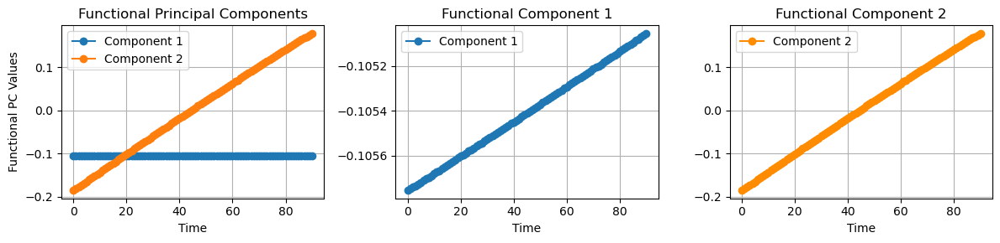

Explain variance FPC1 (%):  99.99541540509125
Explain variance FPC2 (%):  0.004567289166225347
FPC Scores:
          PC1_Scores  PC2_Scores
3550995  107.739368    0.463722
3551012   10.189149   -0.872549
3551031  315.567684   -0.174101
3551047  189.279095    1.082127
3551065  104.327362    0.521352
...             ...         ...
3518442  585.567207   -5.789235
3518443  331.635655   -6.783318
3518444  422.866251   -6.959739
3518445  254.501070   -6.843832
3518456  634.603988   -5.829742

[4893 rows x 2 columns]
The time series contributing most to PC1 is at index 418 with TestID 3556268
The time series contributing most to PC2 is at index 2526 with TestID 3567091


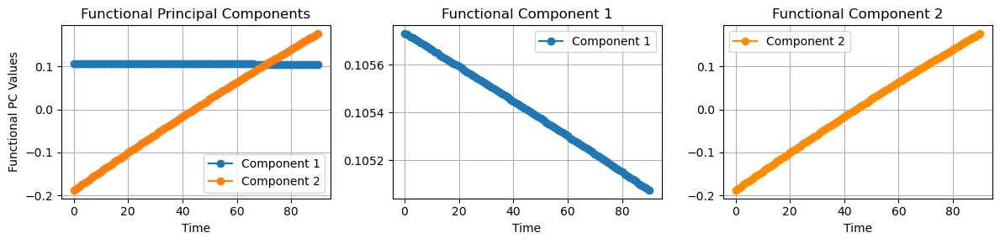

In [20]:
perform_functional_pca(B1_blood_cal_window)
perform_functional_pca(B2_blood_cal_window)

## Cal Window:  System 1/2 - Aqueous

Explain variance FPC1 (%):  99.99402628874088
Explain variance FPC2 (%):  0.005943245121920702
FPC Scores:
           PC1_Scores  PC2_Scores
12414372  370.691377    2.814008
12414373  373.625801    2.822501
12414374  407.810233    3.268249
12414375  405.188164    3.143201
12414377  365.695460    2.549781
...              ...         ...
12470355 -117.699988   -3.399520
12470361   60.284807   -1.418356
12470365  125.647578   -0.829341
12539049  129.244533   -1.050934
12622570   -7.563354   -1.747086

[1431 rows x 2 columns]
The time series contributing most to PC1 is at index 472 with TestID 12437598
The time series contributing most to PC2 is at index 203 with TestID 12615993


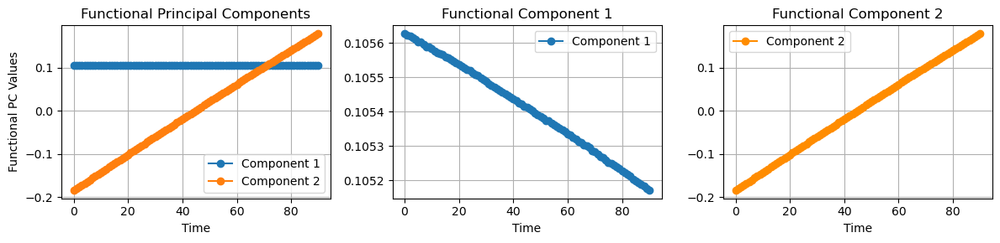

Explain variance FPC1 (%):  99.99374509609675
Explain variance FPC2 (%):  0.006235825869662593
FPC Scores:
          PC1_Scores  PC2_Scores
3545083  542.405894    3.544643
3545084  531.495469    3.188401
3545085  458.332247    2.269276
3545086  544.628557    3.788931
3545087  455.449713    3.318268
...             ...         ...
3518583  578.831070   -6.471654
3518675  603.310206   -6.095167
3518676  425.468952   -5.943599
3518677  412.730241   -7.148036
3518678  311.542760   -7.127060

[2852 rows x 2 columns]
The time series contributing most to PC1 is at index 195 with TestID 3548448
The time series contributing most to PC2 is at index 2426 with TestID 3567819


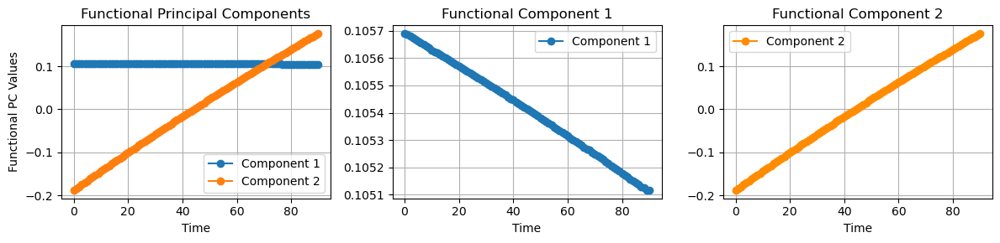

In [21]:
perform_functional_pca(B1_aquous_cal_window)
perform_functional_pca(B2_aquous_cal_window)

## Sample Window:  System 1/2 - Blood

Explain variance FPC1 (%):  99.99620100809345
Explain variance FPC2 (%):  0.003789663009253869
FPC Scores:
           PC1_Scores  PC2_Scores
12414200 -112.216634   -0.147633
12414201 -110.629548   -0.018918
12414202 -115.538024   -0.060158
12414203 -122.847068    0.032328
12414204 -147.902498   -0.031222
...              ...         ...
12537664 -227.197382   -0.078896
12537668 -188.232317   -0.205236
12624891  187.188919    1.235715
12624893  163.116044    1.789061
12537663 -173.113581   -0.214604

[1944 rows x 2 columns]
The time series contributing most to PC1 is at index 240 with TestID 12546591
The time series contributing most to PC2 is at index 452 with TestID 12191207


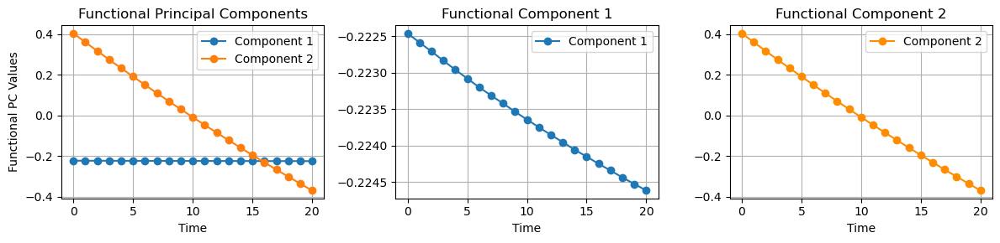

Explain variance FPC1 (%):  99.99794532419344
Explain variance FPC2 (%):  0.0020505592070549014
FPC Scores:
          PC1_Scores  PC2_Scores
3550995  125.469271   -0.522653
3551012   75.409797   -0.458847
3551031  216.979992   -0.288089
3551047  162.389073   -0.421400
3551065  123.388533   -0.467927
...             ...         ...
3518442  128.978857    2.973429
3518443    8.285297    2.764683
3518444   51.254308    2.837675
3518445  -31.406804    3.156691
3518456  151.983057    2.868753

[4893 rows x 2 columns]
The time series contributing most to PC1 is at index 418 with TestID 3556268
The time series contributing most to PC2 is at index 4868 with TestID 3518458


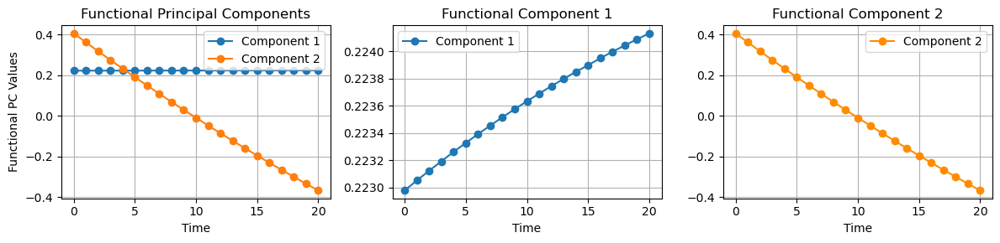

In [22]:
perform_functional_pca(B1_blood_sample_window)
perform_functional_pca(B2_blood_sample_window)

## Sample Window:  System 1/2 - Aqueous

Explain variance FPC1 (%):  99.99969297598615
Explain variance FPC2 (%):  0.00029589986945258775
FPC Scores:
           PC1_Scores  PC2_Scores
12414372  182.961892   -0.373822
12414373  182.249332   -0.359877
12414374  200.003408   -0.373952
12414375  198.678505   -0.351537
12414377  177.869578   -0.310900
...              ...         ...
12470355  -70.960339    0.351319
12470361   17.593421    0.140385
12470365   47.188853    0.185141
12539049   45.405345    0.078044
12622570  -25.167515    0.127562

[1431 rows x 2 columns]
The time series contributing most to PC1 is at index 472 with TestID 12437598
The time series contributing most to PC2 is at index 1044 with TestID 12623840


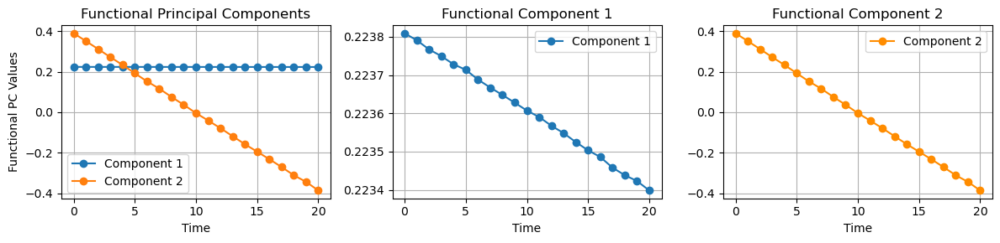

Explain variance FPC1 (%):  99.99976387185511
Explain variance FPC2 (%):  0.00023388079063263817
FPC Scores:
          PC1_Scores  PC2_Scores
3545083  262.090591   -0.305224
3545084  255.026071   -0.312076
3545085  217.728533   -0.154386
3545086  261.449605   -0.297389
3545087  220.446807   -0.279763
...             ...         ...
3518583  244.638959    0.482587
3518675  234.850414    0.495165
3518676  153.581131    0.528870
3518677  141.872451    0.683167
3518678   96.559830    0.676792

[2852 rows x 2 columns]
The time series contributing most to PC1 is at index 212 with TestID 3548492
The time series contributing most to PC2 is at index 2823 with TestID 3518631


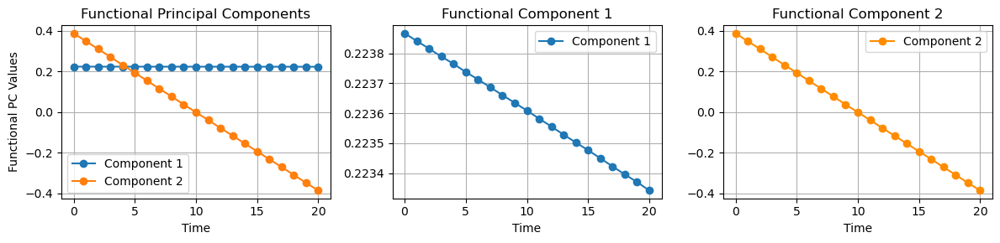

In [23]:
perform_functional_pca(B1_aquous_sample_window)
perform_functional_pca(B2_aquous_sample_window)

# Sample Window

## 8.1. Functional PCA characterization function

In [24]:
def perform_fpca_and_plot(time_series_s1, time_series_s2, features_s1, features_s2, y_axis_min=None, y_axis_max=None):
    # Convert the data matrix to an FDataGrid object
    fd_s1 = FDataGrid(data_matrix=time_series_s1, grid_points=time_series_s1.columns.astype(float)) # System 1
    fd_s2 = FDataGrid(data_matrix=time_series_s2, grid_points=time_series_s2.columns.astype(float)) # System 2

    # Apply Functional PCA for System 1
    fpca_s1 = FPCA(n_components=2)
    fpca_s1.fit(fd_s1)
    fpc_and_scores_s1 = fpca_s1.transform(fd_s1)
    
    # Apply Functional PCA for System 2
    fpca_s2 = FPCA(n_components=2)
    fpca_s2.fit(fd_s2)
    fpc_and_scores_s2 = fpca_s2.transform(fd_s2)

    # --- Explain variance ratio ---
    # System 1
    print('S1 Explain variance PC1 (%): ', fpca_s1.explained_variance_ratio_[0] * 100)
    #print('S1 Explain variance PC2 (%): ', fpca_s1.explained_variance_ratio_[1] * 100)
    # System 2
    print('S2 Explain variance PC1 (%): ', fpca_s2.explained_variance_ratio_[0] * 100)
    #print('S2 Explain variance PC2 (%): ', fpca_s2.explained_variance_ratio_[1] * 100)

    # --- Loadings ---
    # Extract the principal components (loadings)
    principal_components_s1 = fpca_s1.components_ # System 1
    principal_components_s2 = fpca_s2.components_ # System 2

    # --- Scores ---
    # Print the scores to see contributions of each time series to each principal component

    # System 1
    pc_scores_s1 = pd.DataFrame(fpc_and_scores_s1, columns=['PC1_Scores', 'PC2_Scores'],
                                index=[time_series_s1.index[i] for i in range(time_series_s1.shape[0])])
    # System 2
    pc_scores_s2 = pd.DataFrame(fpc_and_scores_s2, columns=['PC1_Scores', 'PC2_Scores'],
                                index=[time_series_s2.index[i] for i in range(time_series_s2.shape[0])])

    # --- Plotting First Principal Component for both Systems ---
    # Extracting data for System 1
    x1 = fpca_s1.components_[0].grid_points[0] 
    y1 = fpca_s1.components_[0].data_matrix[0].flatten()

    # Extracting data for System 2
    x2 = fpca_s2.components_[0].grid_points[0] 
    y2 = fpca_s2.components_[0].data_matrix[0].flatten()

    # Plotting both curves in the same graph
    fig = plt.figure(figsize=(5, 3))
    plt.plot(x1, y1, marker='o', linestyle='-', label='Component 1 - S1')
    plt.plot(x2, y2, marker='o', linestyle='-', label='Component 1 - S2')

    plt.legend()
    plt.grid(True)
    plt.xlabel('Time')
    plt.ylabel('Functional PC 1 Values')
    plt.title('System 1 versus System 2')
    plt.ylim(y_axis_min, y_axis_max)
    #plt.ylim((min(y1.min(), y2.min())-0.001), (min(y1.max(), y2.max())+0.001))

    # Show the plot
    plt.show()

    # --- Scores combined with Additional Features ---

    # Reset the index, making the index a column in the DataFrame
    pc_scores_s1_reset = pc_scores_s1.reset_index()
    pc_scores_s2_reset = pc_scores_s2.reset_index()
    pc_scores_s1_reset.rename(columns={'index': 'TestID'}, inplace=True)
    pc_scores_s2_reset.rename(columns={'index': 'TestID'}, inplace=True)

    # Merging functional pc scores and additional features by TestID
    system1_scores_merged = pd.merge(pc_scores_s1_reset, features_s1, how='inner', on=['TestID'])
    system2_scores_merged = pd.merge(pc_scores_s2_reset, features_s2, how='inner', on=['TestID'])

    # --- Characterization of the Functional PC Scores ---

    # Select Features
    selected_columns = ['TestID', 'PC1_Scores','PC2_Scores','FluidType','AgeOfCardInDaysAtTimeOfTest', 'AmbientTemperature']
    data_s1 = system1_scores_merged[selected_columns].copy()
    data_s2 = system2_scores_merged[selected_columns].copy()

    # Binning continuous predictors into discrete intervals
    data_s1.loc[:, 'AgeBin'] = pd.cut(data_s1['AgeOfCardInDaysAtTimeOfTest'], bins=[0, 9, 50, 100, 500], labels=['<=9', '10-50', '51-100', '>100'])
    data_s1.loc[:, 'AmbientTempBin'] = pd.cut(data_s1['AmbientTemperature'],  bins=[-1, 20, 25, 100], labels=['Below 20', '20-25', 'Above 25'])

    data_s2.loc[:, 'AgeBin'] = pd.cut(data_s2['AgeOfCardInDaysAtTimeOfTest'], bins=[0, 9, 50, 100, 500], labels=['<=9', '10-50', '51-100', '>100'])
    data_s2.loc[:, 'AmbientTempBin'] = pd.cut(data_s2['AmbientTemperature'],  bins=[-1, 20, 25, 100], labels=['Below 20', '20-25', 'Above 25'])

    # Define a color map for fluid types
    color_map_temp = {
        'Below 20': '#4e79a7',
        '20-25': '#f28e2b',
        'Above 25': '#e16759',
    }

    # Combine data to get the overall min and max for both axes
    combined_data = pd.concat([data_s1, data_s2])

    # Determine the range for x and y axes
    min_x = combined_data['PC1_Scores'].min()
    max_x = combined_data['PC1_Scores'].max()
    min_y = combined_data['PC2_Scores'].min()
    max_y = combined_data['PC2_Scores'].max()

    # --- Visualizations ---
    scatter_age_s1 = alt.Chart(data_s1).mark_circle().encode(
        alt.X('PC1_Scores').axis(title="FPC Score 1").scale(domain=[min_x, max_x]),
        alt.Y('PC2_Scores').axis(title="FPC Score 2").scale(domain=[min_y, max_y]),
        color=alt.Color('AgeBin', scale=alt.Scale(scheme='tableau10'), title="Days"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('AgeOfCardInDaysAtTimeOfTest', title="Card Age")]
    ).properties(
        title='FPC Scores by Card Age',
        width=280,
        height=280
    )

    scatter_temp_s1 = alt.Chart(data_s1).mark_circle().encode(
        alt.X('PC1_Scores').axis(title="FPC Score 1").scale(domain=[min_x, max_x]),
        alt.Y('PC2_Scores').axis(title="FPC Score 2").scale(domain=[min_y, max_y]),
        #color=alt.Color('AmbientTempBin', scale=alt.Scale(scheme='tableau10'), title="°C"),
        color=alt.Color('AmbientTempBin', scale=alt.Scale(domain=list(color_map_temp.keys()), range=list(color_map_temp.values())), title="°C"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('AmbientTemperature', title="Ambient Temperature")]
    ).properties(
        title='FPC Scores by Ambient Temperature',
        width=280,
        height=280
    )

    scatter_fluid_s1 = alt.Chart(data_s1).mark_circle().encode(
        alt.X('PC1_Scores').axis(title="FPC Score 1").scale(domain=[min_x, max_x]),
        alt.Y('PC2_Scores').axis(title="FPC Score 2").scale(domain=[min_y, max_y]),
        color=alt.Color('FluidType', scale=alt.Scale(scheme='tableau10'), title="Fluid"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('FluidType', title="Fluid Type")]
    ).properties(
        title='FPC Scores by Fluid Type',
        width=280,
        height=280
    )

    scatter_age_s2 = alt.Chart(data_s2).mark_circle().encode(
        alt.X('PC1_Scores').axis(title="FPC Score 1").scale(domain=[min_x, max_x]),
        alt.Y('PC2_Scores').axis(title="FPC Score 2").scale(domain=[min_y, max_y]),
        color=alt.Color('AgeBin', scale=alt.Scale(scheme='tableau10'), title="Days"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('AgeOfCardInDaysAtTimeOfTest', title="Card Age")]
    ).properties(
        title='FPC Scores by Card Age',
        width=280,
        height=280
    )

    scatter_temp_s2 = alt.Chart(data_s2).mark_circle().encode(
        alt.X('PC1_Scores').axis(title="FPC Score 1").scale(domain=[min_x, max_x]),
        alt.Y('PC2_Scores').axis(title="FPC Score 2").scale(domain=[min_y, max_y]),
        #color=alt.Color('AmbientTempBin', scale=alt.Scale(scheme='tableau10'), title="°C"),
        color=alt.Color('AmbientTempBin', scale=alt.Scale(domain=list(color_map_temp.keys()), range=list(color_map_temp.values())), title="°C"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('AmbientTemperature', title="Ambient Temperature")]
    ).properties(
        title='FPC Scores by Ambient Temperature',
        width=280,
        height=280
    )

    scatter_fluid_s2 = alt.Chart(data_s2).mark_circle().encode(
        alt.X('PC1_Scores').axis(title="FPC Score 1").scale(domain=[min_x, max_x]),
        alt.Y('PC2_Scores').axis(title="FPC Score 2").scale(domain=[min_y, max_y]),
        color=alt.Color('FluidType', scale=alt.Scale(scheme='tableau10'), title="Fluid"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('FluidType', title="Fluid Type")]
    ).properties(
        title='FPC Scores by Fluid Type',
        width=280,
        height=280
    )

    # --- Display the plots ---
    # System 1 plots
    s1_plots = alt.hconcat(
        scatter_fluid_s1, scatter_age_s1, scatter_temp_s1
    ).resolve_scale(
        color='independent'
    ).properties(
        title='System 1'
    )

    # System 2 plots
    s2_plots = alt.hconcat(
        scatter_fluid_s2, scatter_age_s2, scatter_temp_s2
    ).resolve_scale(
        color='independent'
    ).properties(
        title='System 2'
    )

    # Concatenating plots in same grid
    plots_vconcatenated = alt.vconcat(
        s1_plots,
        s2_plots
    ).configure_view(
        stroke=None
    )

    return plots_vconcatenated

# 11.1.1. Functional PC1 and Characterization of FPC Scores

# ----------------------------- Sensor A ----------------------------------------------

# Cal Window

### 1) System 1 versus System 2: Sensor A - Blood - Cal Window

S1 Explain variance PC1 (%):  99.99897848822087
S2 Explain variance PC1 (%):  99.99891971165007


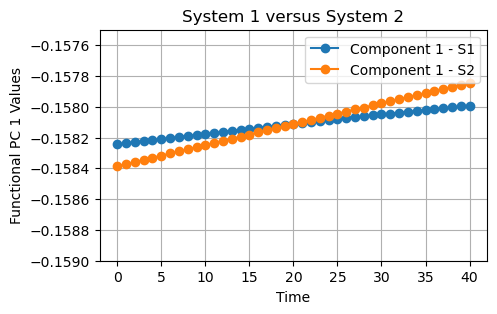

alt.VConcatChart(...)

In [25]:
perform_fpca_and_plot(A1_blood_cal_window, A2_blood_cal_window, A1_Merged, A2_Merged, y_axis_min = -0.1590, y_axis_max = -0.1575)

### 2) System 1 versus System 2: Sensor A - Aqueous - Cal Window

S1 Explain variance PC1 (%):  99.99903631073364
S2 Explain variance PC1 (%):  99.99906857395064


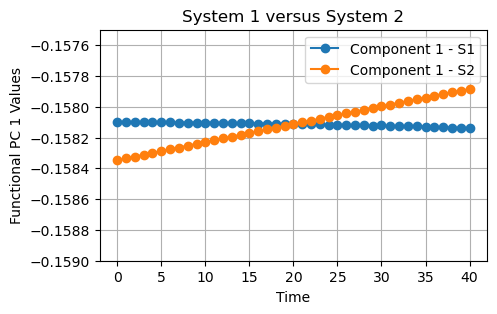

alt.VConcatChart(...)

In [26]:
perform_fpca_and_plot(A1_aquous_cal_window, A2_aquous_cal_window, A1_Merged, A2_Merged, y_axis_min = -0.1590, y_axis_max = -0.1575)

# Sample Window
### 1) System 1 versus System 2: Sensor A - Blood - Sample Window

S1 Explain variance PC1 (%):  99.9997397699384
S2 Explain variance PC1 (%):  99.99965614804258


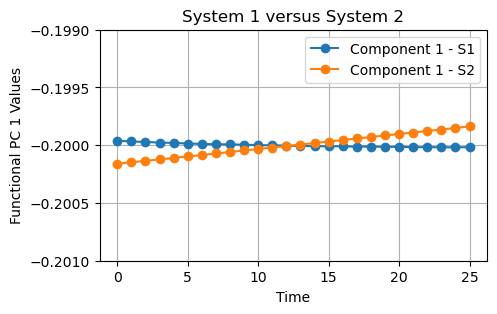

alt.VConcatChart(...)

In [27]:
# 0.20025 - 0.19975
perform_fpca_and_plot(A1_blood_sample_window, A2_blood_sample_window, A1_Merged, A2_Merged, y_axis_min = -0.2010, y_axis_max = -0.1990)

### 2) System 1 versus System 2: Sensor A - Aqueous - Sample Window

S1 Explain variance PC1 (%):  99.99968073771691
S2 Explain variance PC1 (%):  99.99967378883693


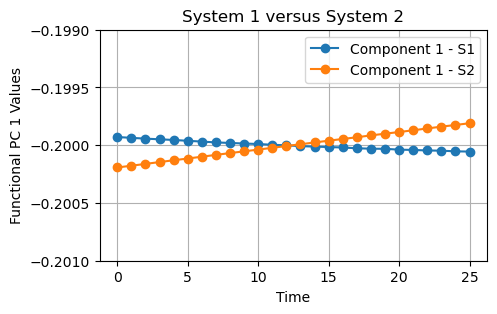

alt.VConcatChart(...)

In [28]:
perform_fpca_and_plot(A1_aquous_sample_window, A2_aquous_sample_window, A1_Merged, A2_Merged, y_axis_min = -0.2010, y_axis_max = -0.1990)

# ---------------------------------- Sensor B ----------------------------------------------

### 1) System 1 versus System 2: Sensor B - Aqueous - Cal Window

S1 Explain variance PC1 (%):  99.99402628874086
S2 Explain variance PC1 (%):  99.9937450960967


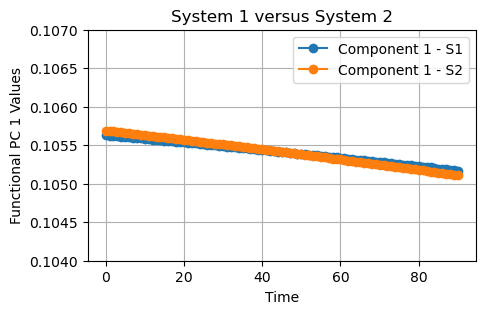

alt.VConcatChart(...)

In [29]:
perform_fpca_and_plot(B1_aquous_cal_window, B2_aquous_cal_window, B1_Merged, B2_Merged, y_axis_min = 0.104, y_axis_max = 0.107)

### 1) System 1 versus System 2: Sensor B - Aqueous - Sample Window

S1 Explain variance PC1 (%):  99.99969297598615
S2 Explain variance PC1 (%):  99.99976387185511


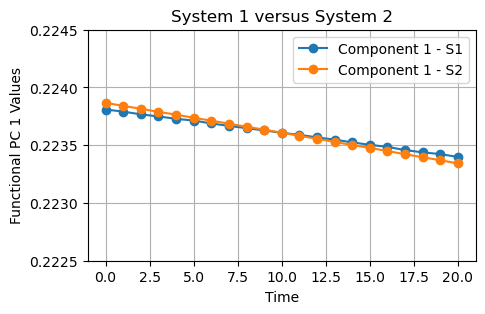

alt.VConcatChart(...)

In [30]:
perform_fpca_and_plot(B1_aquous_sample_window, B2_aquous_sample_window, B1_Merged, B2_Merged, y_axis_min = 0.2225, y_axis_max = 0.2245)

### 2) System 1 versus System 2: Sensor B - Blood - Cal Window

S1 Explain variance PC1 (%):  99.99429965213402
S2 Explain variance PC1 (%):  99.99541540509125


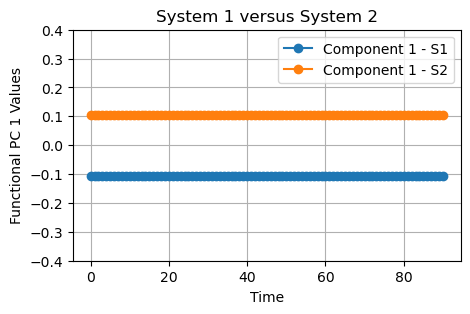

alt.VConcatChart(...)

In [31]:
perform_fpca_and_plot(B1_blood_cal_window, B2_blood_cal_window, B1_Merged, B2_Merged,y_axis_min = -0.4, y_axis_max = 0.4)

### 2) System 1 versus System 2: Sensor B - Blood - Sample Window

S1 Explain variance PC1 (%):  99.99620100809345
S2 Explain variance PC1 (%):  99.99794532419344


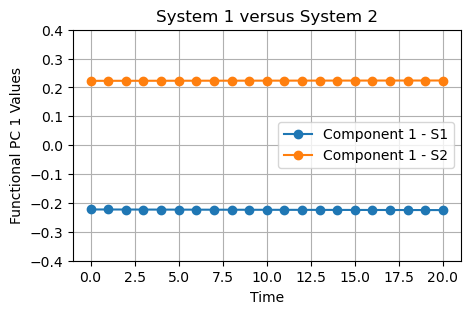

alt.VConcatChart(...)

In [32]:
perform_fpca_and_plot(B1_blood_sample_window, B2_blood_sample_window, B1_Merged, B2_Merged, y_axis_min = -0.4, y_axis_max = 0.4)